**MAESTRÍA EN INTELIGENCIA ARTIFICIAL APLICADA**

**Curso: TC4033 - Visión computacional para imágenes y video**

Tecnológico de Monterrey

Prof Gilberto Ochoa Ruiz

**Semana 2**
Algoritmos de mejoramiento de imágenes basado por pixeles

---

**Equipo 23**

|                 NOMBRE              | MATRÍCULA |
|-------------------------------------|-----------|
| David Alexis García Espinosa        | A01795178 |
| Jorge Santana Mendoza               | A01376306 |
| José Manuel Romo Peredo             | A0        |
| Luis Daniel Ortega Muñoz            | A01795197 |
| Luis Fernando Caporal Montes de Oca | A01795898 |               

# 2. Image Enhancement

## Table of Contents
1. [Libraries](#libraries)
2. [Histogram Equalization](#hist)
3. [Denoising with Filters](#denoising)
4. [Challenge](#challenge)
5. [References](#refer)

## Importing Libraries <a class="anchor" id="libraries" ></a>

In [ ]:
from PIL import Image, ImageOps
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.image as mpimg
from skimage import exposure
import skimage
from scipy.ndimage.filters import gaussian_filter as gauss
from scipy.ndimage.filters import median_filter as med
import cv2

<ipython-input-3-0238ad4d13f7>:7: DeprecationWarning: Please import `gaussian_filter` from the `scipy.ndimage` namespace; the `scipy.ndimage.filters` namespace is deprecated and will be removed in SciPy 2.0.0.
  from scipy.ndimage.filters import gaussian_filter as gauss
<ipython-input-3-0238ad4d13f7>:8: DeprecationWarning: Please import `median_filter` from the `scipy.ndimage` namespace; the `scipy.ndimage.filters` namespace is deprecated and will be removed in SciPy 2.0.0.
  from scipy.ndimage.filters import median_filter as med


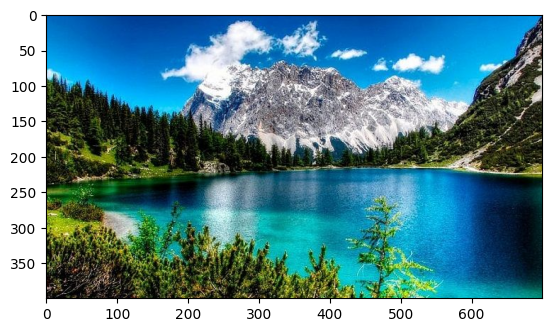

In [ ]:
original_image = Image.open('data/image.jpg')
plt.imshow(original_image)
type(original_image)

# Save the image
np.save('data/img.npy', original_image)

#Load the image
original_image = np.load('data/img.npy')

## Histogram Equalization<a class="anchor" id="hist" ></a>

Let's look at the distribution of pixel values in the image.

Ideally, the image should have relatively even distribution of values, indicating good contrast and making it easier to extract analytical information.

An easy way to check this is to plot a histogram.

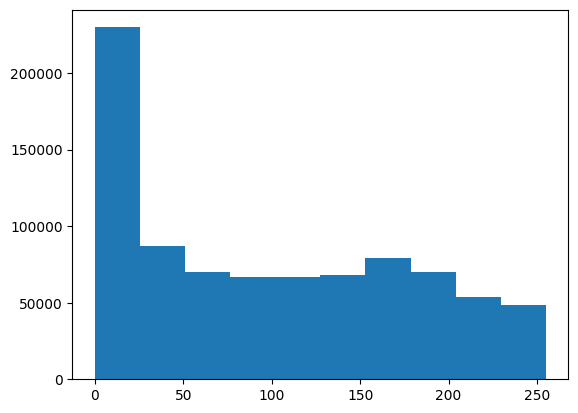

In [ ]:
# Plot a histogram - we need to use ravel to "flatten" the 3 dimensions
plt.hist(original_image.ravel())
plt.show()

Another useful way to visualize the statistics of an image is as a cumulative distribution function (CDF) plot. Which shows the cumulative pixel intensity frequencies from 0 to 255.

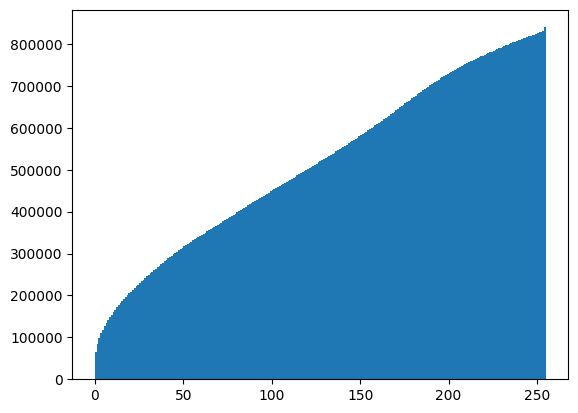

In [ ]:
plt.hist(original_image.ravel(), bins=255, cumulative=True)
plt.show()

The histogram and CDF for our image show pretty uneven distribution - there's a lot of contrast in the image. Ideally we should equalize the values in the images we want to analyse to try to make our images more consistent in terms of the shapes they contain irrespective of light levels.

Histogram equalization is often used to improve the statistics of images. In simple terms, the histogram equalization algorithm attempts to adjust the pixel values in the image to create a more uniform distribution. The code in the cell below uses the  **exposure.equalize_hist** method from the **skimage** package to equalize the image.  

/usr/local/lib/python3.11/dist-packages/skimage/_shared/utils.py:445: UserWarning: This might be a color image. The histogram will be computed on the flattened image. You can instead apply this function to each color channel, or set channel_axis.
  return func(*args, **kwargs)


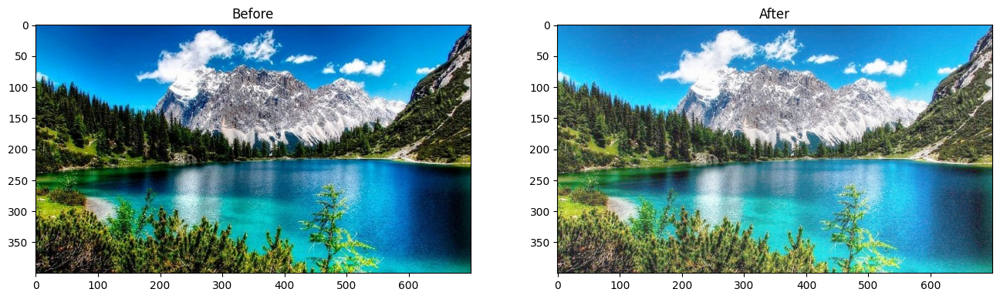

In [ ]:
original_image_eq = exposure.equalize_hist(original_image)

fig = plt.figure(figsize=(16, 8))

# Subplot for original image
a=fig.add_subplot(1,2,1)
imgplot = plt.imshow(original_image)
a.set_title('Before')

# Subplot for processed image
a=fig.add_subplot(1,2,2)
imgplot = plt.imshow(original_image_eq)
a.set_title('After')

plt.show()

As with most image operations, there's more than one way to do this. For example, you could also use the **PIL.ImgOps.equalize** method:

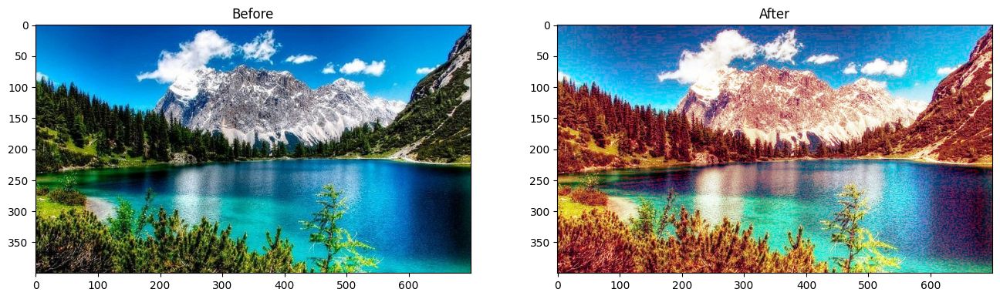

In [ ]:

# Equalize the image - but we need to convert the numpy array back to the PIL image format
image_PIL_eq = ImageOps.equalize(Image.fromarray(original_image))

# Display using matplotlib

# Create a figure
fig = plt.figure(figsize=(16, 8))

# Subplot for original image
a=fig.add_subplot(1,2,1)
imgplot = plt.imshow(original_image)
a.set_title('Before')

# Subplot for processed image
a=fig.add_subplot(1,2,2)
imgplot = plt.imshow(image_PIL_eq)
a.set_title('After')

plt.show()

Now let's see what that's done to the histogram and CDF plots:

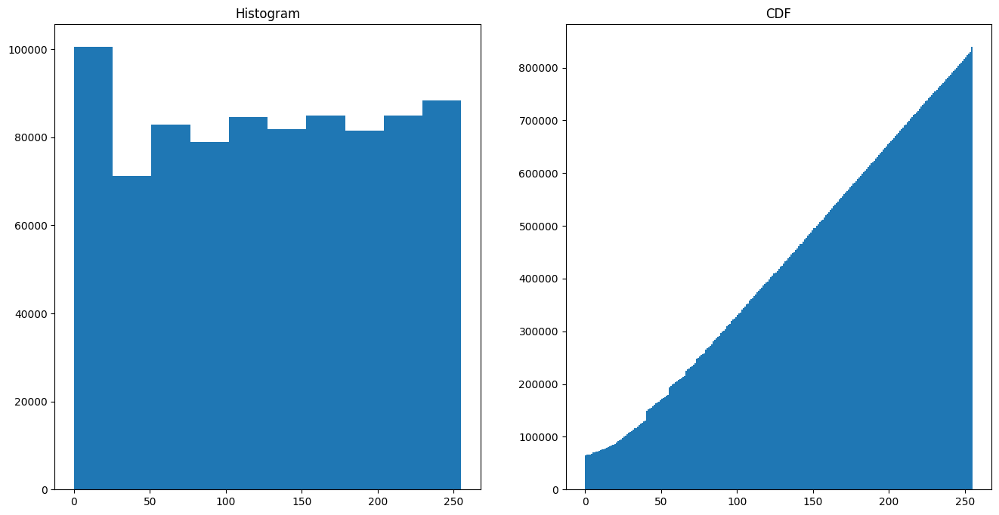

In [ ]:
# Display histograms
img_eq = np.array(image_PIL_eq)

# Create a figure
fig = plt.figure(figsize=(16, 8))

# Subplot for original image
a=fig.add_subplot(1,2,1)
imgplot = plt.hist(img_eq.ravel())
a.set_title('Histogram')

# Subplot for processed image
a=fig.add_subplot(1,2,2)
imgplot = plt.hist(img_eq.ravel(), bins=255, cumulative=True)
a.set_title('CDF')

plt.show()

The pixel intensities are more evenly distributed in the equalized image. In particular, the cumulative density shows a straight diagonal cumulation; which is a good sign that the pixel intensity values have been equalized.

## Denoising with Filters <a class="anchor" id="denoising" ></a>

Often images need to be cleaned up to remove "salt and pepper" noise.

### Add Some Random Noise
Let's add some random noise to our image - such as you might see in a photograph taken in low light or at a low resolution.

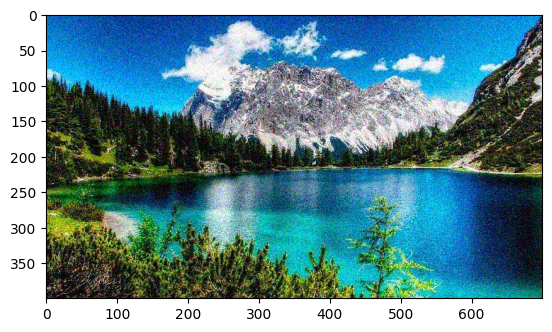

In [ ]:
img_n = skimage.util.random_noise(original_image)
plt.imshow(img_n)

### Using a Gaussian Filter
A Gaussian filter applies a weighted average (mean) value for pixels based on the pixels that surround them.

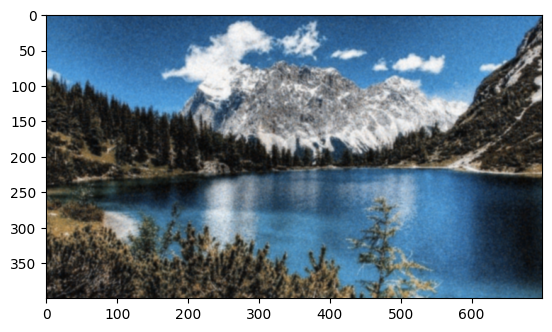

In [ ]:
img3_gauss = gauss(img_n, sigma=1)
plt.imshow(img3_gauss)

### Using a Median Filter
The Gaussian filter results in a blurred image, which may actually be better for feature extraction as it makes it easier to find contrasting areas. If it's too blurred, we could try a median filter, which as the name suggests applies the median value to pixels based on the pixels around them.

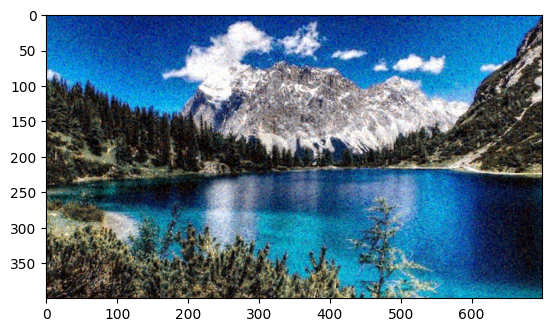

In [ ]:
img_med = med(img_n, size=2)
plt.imshow(img_med)

## Challenge <a class="anchor" id="challenge" ></a>

In [ ]:
## Auxiliar function to compare an original image, image after basic HE, and image with a new method
def compare_images(image1, image2, image3, is_grayscale=False):
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))

    # Subplot for original image
    axs[0].imshow(image1, cmap='gray' if is_grayscale else None)
    # axs[0].set_title('Original')

    # Subplot for processed image
    axs[1].imshow(image2, cmap='gray' if is_grayscale else None)
    # axs[1].set_title('Basic EH')

    # Subplot for processed image
    axs[2].imshow(image3, cmap='gray' if is_grayscale else None)
    # axs[2].set_title('')

    plt.show()

### Tile-based method histogram equalization

In [ ]:
!pip install image_slicer

In [ ]:
from image_slicer import slice

n = 4
slice('data/image.jpg', n)

(<Tile #1 - image_01_01.png>,
 <Tile #2 - image_01_02.png>,
 <Tile #3 - image_02_01.png>,
 <Tile #4 - image_02_02.png>)

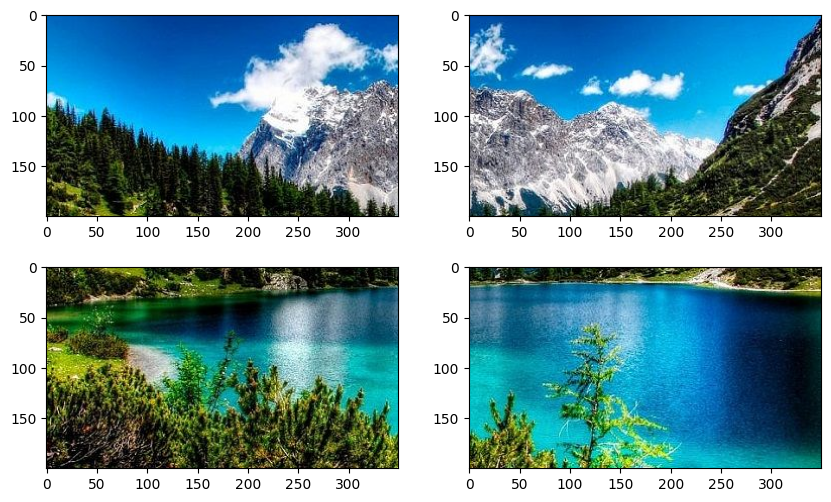

In [ ]:
fig = plt.figure(figsize=(10, 6))

plt.subplot(2,2,1)
img = Image.open(f'data/image_01_01.png')
plt.imshow(img)

plt.subplot(2,2,2)
img = Image.open(f'data/image_01_02.png')
plt.imshow(img)

plt.subplot(2,2,3)
img = Image.open(f'data/image_02_01.png')
plt.imshow(img)

plt.subplot(2,2,4)
img = Image.open(f'data/image_02_02.png')
plt.imshow(img)

plt.show()

Ya que tenemos nuestras ventanas, podemos aplicar ecualización de histogramas a cada una de ellas de forma independiente.

In [ ]:
# Let's start by performing histogram equalization to each of the created tiles.
img1 = Image.open(f'data/image_01_01.png')
img1_eq = exposure.equalize_hist(np.array(img1))

img2 = Image.open(f'data/image_01_02.png')
img2_eq = exposure.equalize_hist(np.array(img2))

img3 = Image.open(f'data/image_02_01.png')
img3_eq = exposure.equalize_hist(np.array(img3))

img4 = Image.open(f'data/image_02_02.png')
img4_eq = exposure.equalize_hist(np.array(img4))


Ahora mostremos cada una de las ventanas después de aplicar EH.

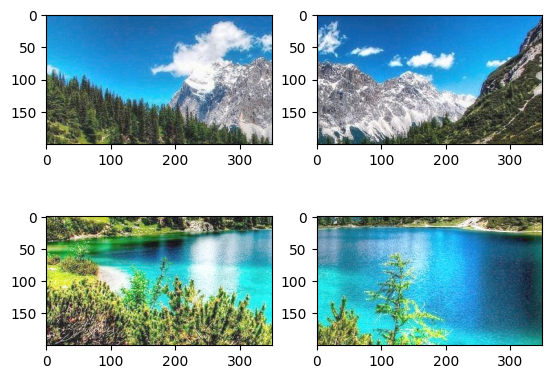

In [ ]:
plt.subplot(2,2,1)
plt.imshow(img1_eq)

plt.subplot(2,2,2)
plt.imshow(img2_eq)

plt.subplot(2,2,3)
plt.imshow(img3_eq)

plt.subplot(2,2,4)
plt.imshow(img4_eq)

plt.show()

Ahora procedamos a combinar las ventanas en una sola imagen para ver el resultado final.

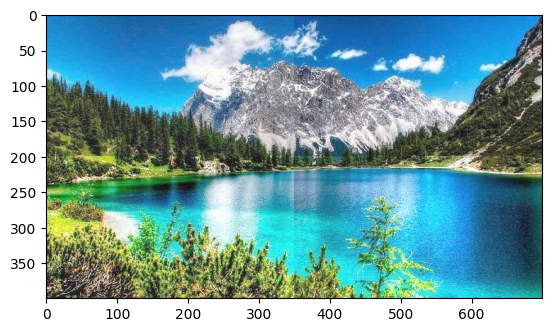

In [ ]:
import image_slicer

original_image = Image.open('data/image.jpg')

combined = Image.new('RGB', (original_image.width, original_image.height))

tile1 = Image.fromarray(np.uint8(img1_eq*255))
tile2 = Image.fromarray(np.uint8(img2_eq*255))
tile3 = Image.fromarray(np.uint8(img3_eq*255))
tile4 = Image.fromarray(np.uint8(img4_eq*255))

for index, image in enumerate([tile1, tile2, tile3, tile4]):
    row = index // 2
    col = index % 2
    combined.paste(image, (col * tile1.width, row * tile1.height))

plt.imshow(combined)


Para experimentar con diferentes parámetros e imágenes, creamos una función que realice todos los pasos anteriores de forma automática.

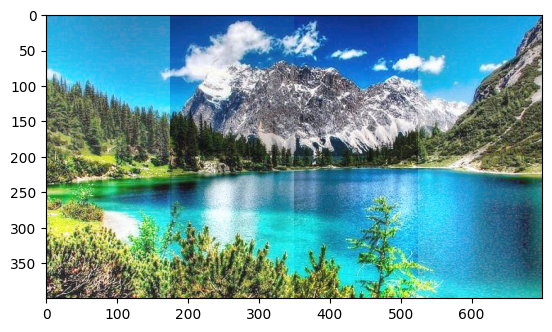

In [ ]:
def tile_based_histogram_equalization(image_path, n_rows, n_cols):
    # Split the image into tiles
    tiles = slice(image_path, row=n_rows, col=n_cols, save=False)

    # Apply histogram equalization to each tile
    tiles_eq = [exposure.equalize_hist(np.array(tile.image)) for tile in tiles]

    # Combine into the final result
    original_image = Image.open(image_path)
    combined = Image.new('RGB', (original_image.width, original_image.height))
    for index, tile in enumerate(tiles_eq):
        tile_img = Image.fromarray(np.uint8(tile * 255))
        row = index // n_cols
        col = index % n_cols
        combined.paste(tile_img, (col * tile_img.width, row * tile_img.height))

    return combined

res = tile_based_histogram_equalization('data/image.jpg', 2, 4)
plt.imshow(res)

Uno de los desafíos con este método es que el resultado final puede mostrar la división entre las ventanas visiblemente. Una manera de mitigar esto sería elegir cuidadosamente la cantidad de ventanas según las características de la imagen. Por ejemplo, en la imagen anterior podemos minimizar el problema si utilizamos 1 columna y 2 filas. Esto es porque el límite de la ventana coincide con la división entre el agua y las montañas en la imagen.

Otra manera de minimizar este efecto es aplicando técnicas de "smoothing", que ayuden a difuminar la transición entre cada uno de los "tiles". Si bien no cambiará el hecho de que una región de la imagen puede tener un nivel de contraste distinto, sí podría evitar que la transición sea muy repentina y notable a simple vista.

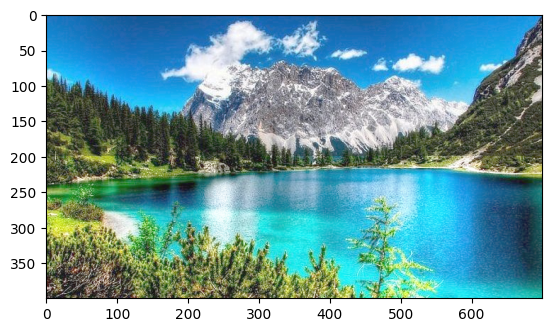

In [ ]:
plt.imshow(tile_based_histogram_equalization('data/image.jpg', 2, 1))

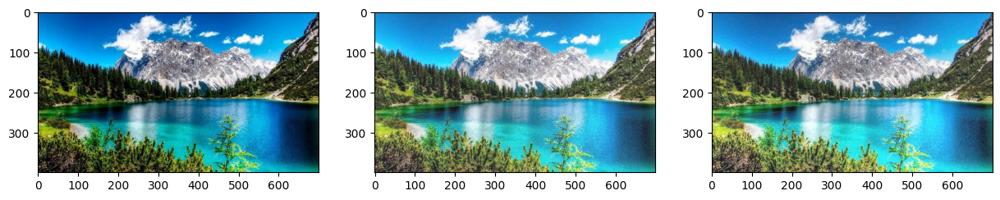

In [ ]:
image = np.array(Image.open('data/image.jpg'))
image_eq = exposure.equalize_hist(np.array(image))
image_tile_eq = np.array(tile_based_histogram_equalization('data/image.jpg', 2, 1))

compare_images(image, image_eq, image_tile_eq)


### Sliding Window Adaptive Histogram Equalization

Sliding Window Adaptive Histogram Equalization, o SWAHE, utiliza la misma base que el método de equalización de histogramas, pero aplica ajustes de forma local.

La principal diferencia entre SWAHE y la EH básica es que en SWAHE se evalúa el histograma local de cada uno de los pixeles de la imagen, y con base a estos histogramas se calcula el nuevo valor para ese pixel específico. Esto implica que primero se debe obtener el histograma local de cada pixel individual a través de una ventana. Se le conoce como ventana deslizante porque este proceso se realiza para cada uno de los pixeles.

A continuación se muestra una implementación básica de SWAHE aplicado a imágenes en escala de grises.

In [ ]:
def swahe(image_path, window_size):
    L = 256
    image = ImageOps.grayscale(Image.open(image_path))
    image_width = image.width
    image_height = image.height

    image = np.array(image)

    # Use skimage to get the local histogram for each pixel, using a sliding window
    window = skimage.morphology.footprint_rectangle(window_size)
    local_histograms = skimage.filters.rank.windowed_histogram(image, window, n_bins=L)

    result = np.zeros_like(image)
    for i in range(image_height):
        for j in range(image_width):
            # The luminosity of the current pixel
            px_value = image[i, j]

            # The value of the new pixel will be given by the sum of all histogram values prior to it,
            # multiplied by the max luminosity value minus 1
            new_value = np.uint8((L - 1) * np.sum(local_histograms[i, j, 0:px_value]))

            # Set the value in the new image
            result[i, j] = new_value

    return result

Comparación de una imagen original y SWAHE con ventana de 100x100 y 300x300

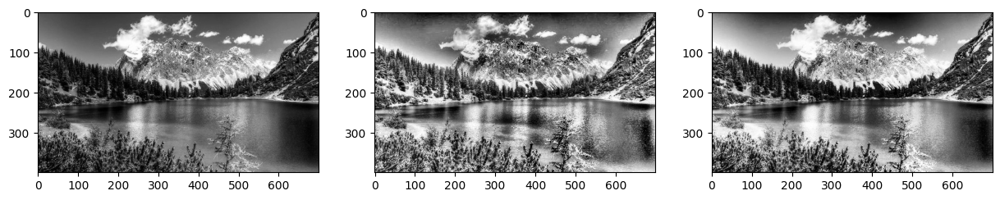

In [ ]:
image = np.array(ImageOps.grayscale(Image.open('data/image.jpg')))
image_swahe_100 = swahe('data/image.jpg', (100, 100))
image_swahe_300 = swahe('data/image.jpg', (300, 300))

compare_images(image, image_swahe_100, image_swahe_300, is_grayscale=True)

Comparación de la imagen original, imagen con equalización de histogramas básica y SWAHE con ventana de 200x200

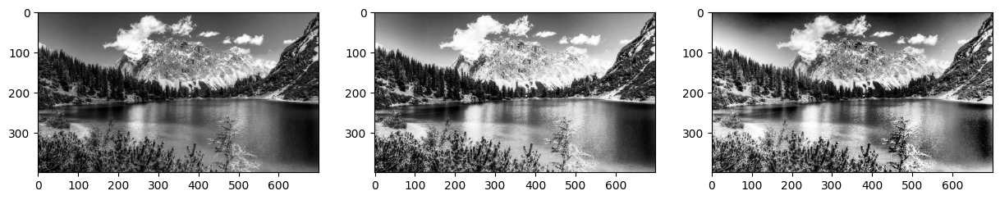

In [ ]:
image = np.array(ImageOps.grayscale(Image.open('data/image.jpg')))
image_eq = exposure.equalize_hist(np.array(image))
image_swahe = swahe('data/image.jpg', (200, 200))

compare_images(image, image_eq, image_swahe, is_grayscale=True)

Comparación de una segunda imagen original y SWAHE con ventana de 100x100 y 300x300

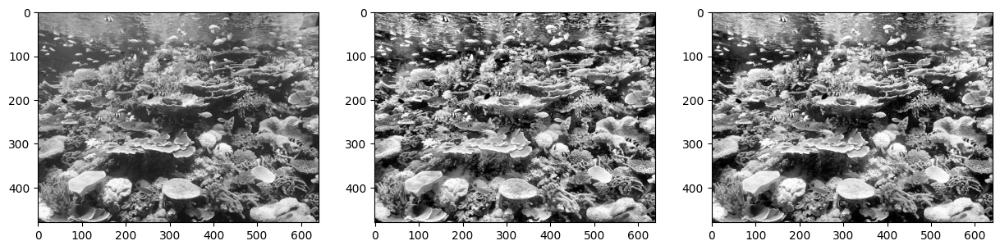

In [ ]:
image= np.array(ImageOps.grayscale(Image.open('data/image_2.jpg')))
image_swahe_100 = swahe('data/image_2.jpg', (100, 100))
image_swahe_300 = swahe('data/image_2.jpg', (300, 300))

compare_images(image, image_swahe_100, image_swahe_300, is_grayscale=True)

Comparación de la imagen original, imagen con equalización de histogramas básica y SWAHE con ventana de 200x200

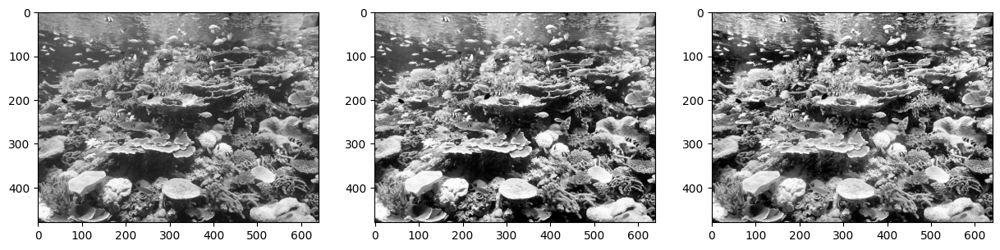

In [ ]:
image = np.array(ImageOps.grayscale(Image.open('data/image_2.jpg')))
image_eq = exposure.equalize_hist(np.array(image))
image_swahe = swahe('data/image_2.jpg', (200, 200))

compare_images(image, image_eq, image_swahe, is_grayscale=True)

### Contrast Limited Adaptive Histogram Equalization

Contrast Limited Adaptive Histogram Equalization, o CLAHE, es un algoritmo para el mejoramiento de imágenes que funciona de una manera similar al método por ventanas explorado anteriormente. Sin embargo, también aplica limitación de contraste durante la fase de ecualización local. De esta forma, se define un límite de contraste y, en cada ventana, las intensidades que excedan ese límite (que puede visualizarse como bins del histograma fuera del rango) son descartados y se distribuyen uniformemente en el resto del histograma. Finalmente, este método reduce los bordes entre las ventanas mediante un escalado con interpolación bilineal.

Este método es particularmente útil cuando el histograma de una imagen no se encuentra agrupado en una sola región.

In [ ]:
def clahe(image_path, clip_limit, tile_size):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    return clahe.apply(image)

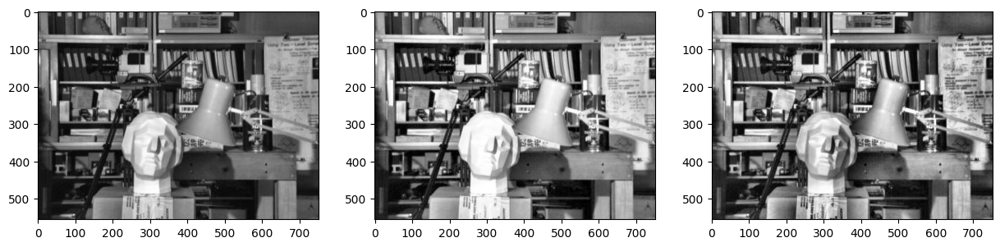

In [ ]:
image = np.array(ImageOps.grayscale(Image.open('data/image_clahe.jpg')))
image_eq = exposure.equalize_hist(np.array(image))
image_clahe = clahe('data/image_clahe.jpg', 2.0, (8,8))

compare_images(image, image_eq, image_clahe, is_grayscale=True)

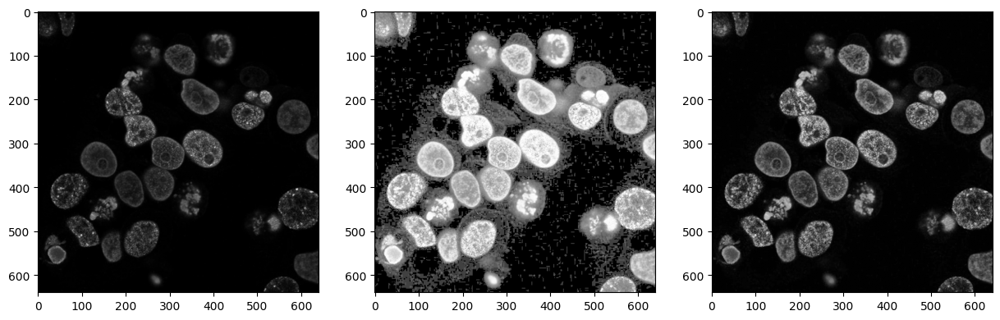

In [ ]:
image = np.array(ImageOps.grayscale(Image.open('data/image_clahe_2.jpg')))
image_eq = exposure.equalize_hist(np.array(image))
image_clahe = clahe('data/image_clahe_2.jpg', 2.0, (8,8))

compare_images(image, image_eq, image_clahe, is_grayscale=True)

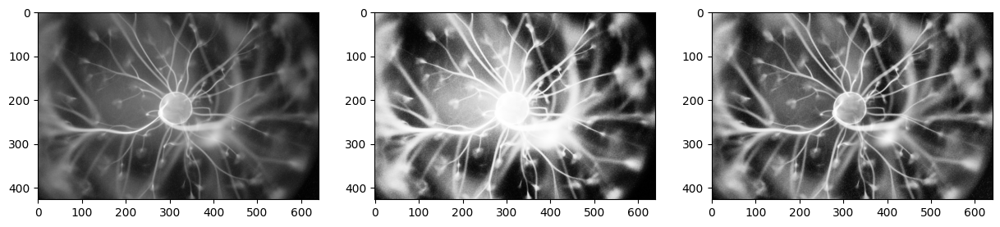

In [ ]:
image = np.array(ImageOps.grayscale(Image.open('data/image_clahe_3.jpg')))
image_eq = exposure.equalize_hist(np.array(image))
image_clahe = clahe('data/image_clahe_3.jpg', 2.0, (8,8))

compare_images(image, image_eq, image_clahe, is_grayscale=True)

## References <a class="anchor" id="refer" ></a>

* Gonzalez, R. & Woods, R. (2018). Digital Image Processing.  4° Edition. Pearson.
* Kurak, C. W. Jr. (1990). Adaptive histogram equalization, a parallel implementation (Graduate thesis, University of North Florida). UNF Graduate Theses and Dissertations, 260. https://digitalcommons.unf.edu/etd/260
* OpenCV. (2025). Histograms - 2: Histogram Equalization. OpenCV-Python Tutorials. Retrieved January 19, 2025, from https://docs.opencv.org/4.12.0-dev/d5/daf/tutorial_py_histogram_equalization.html